In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/places365/val_256/"
x = load(os.path.join(path, 'train_samples/Places365_val_00000130.jpg'))
print(x.shape)

(256, 256, 3)


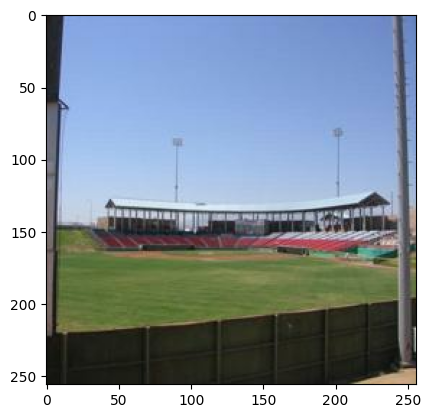

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

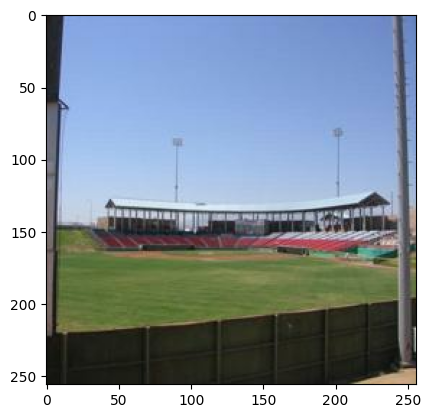

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

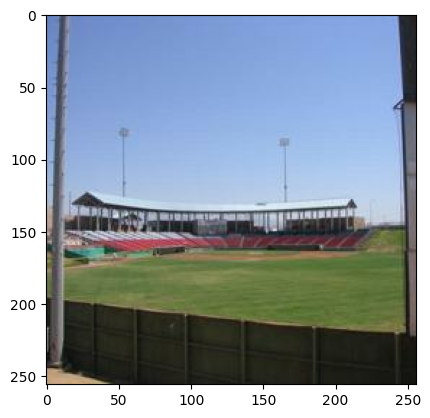

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

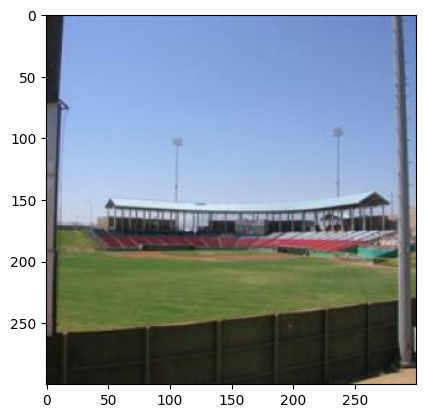

In [16]:
plt.imshow(resize_with_aspect_ratio(x,300)/255)

In [17]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [18]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [19]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [20]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "/train_samples/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.take(8000)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

500

In [21]:
# create input pipeline
val = tf.data.Dataset.list_files(path + "/valid_samples/*.jpg")
val = val.map(load_test_image)
val = val.take(1000)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

63

In [22]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [23]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 128, 128, 3)


In [24]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 256, 256, 3)


In [25]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

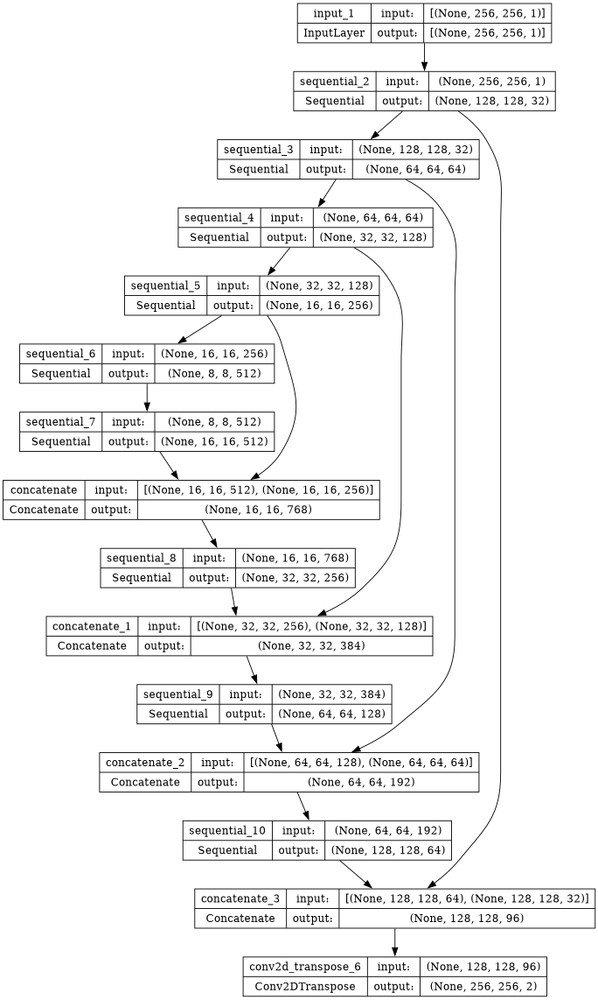

In [26]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [27]:
# gen.load_weights('/kaggle/input/imagenetmodelweights/gen_weight.keras')

In [28]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

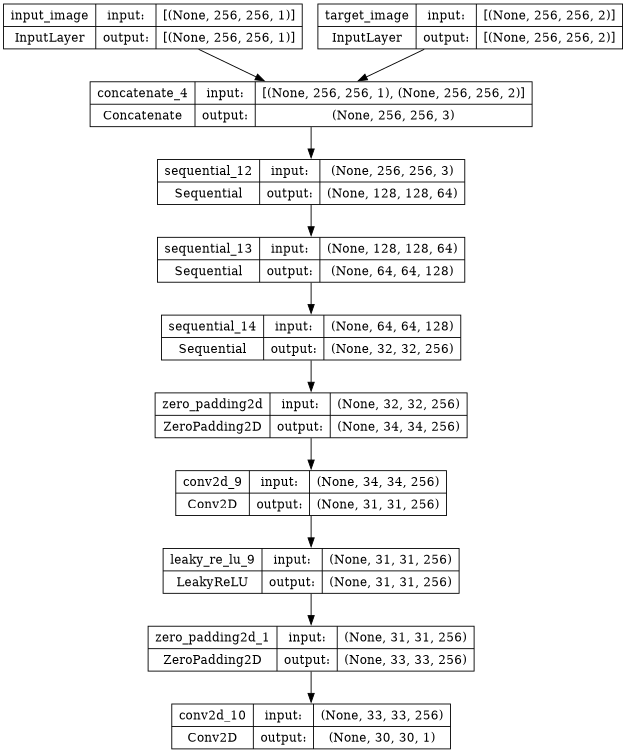

In [29]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [30]:
# disc.load_weights('/kaggle/input/imagenetmodelweights/disc_weight.keras')

In [31]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [32]:
LAMBDA = 100

In [33]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [34]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 80*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [35]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [36]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [37]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [38]:
epochs = 250

In [39]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [40]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [41]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [42]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [43]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [44]:
os.mkdir('/kaggle/working/gen_output/')

In [45]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [46]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


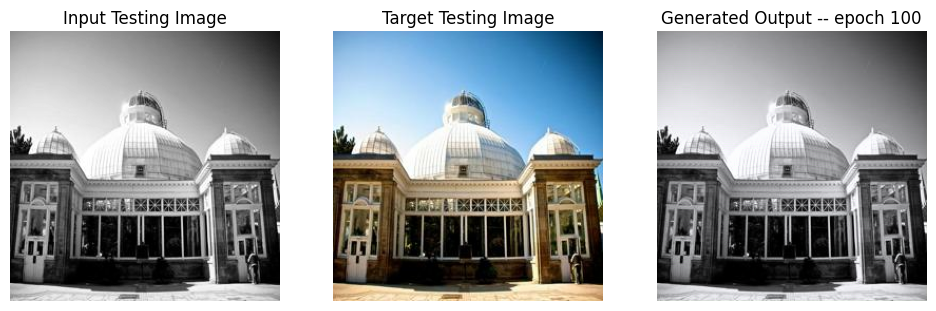

SSIM Score: 0.9112069606781006
PSNR Score: 18.653383255004883


In [47]:
display_random_test_image(gen, '/kaggle/input/places365/val_256/valid_samples/Places365_val_00000547.jpg',100)

In [48]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/places365/val_256/valid_samples/Places365_val_00000547.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [49]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 0s 0us/step
Training Details
Generator-- total_loss:6.84504 gan_loss:1.33656 l1_loss:0.04723 perceptual_loss:0.00982 Discriminator-- total_loss:1.35265 real_loss:0.67393 generated_loss:0.67872 --- SSIM 0.85088 PSNR 22.11583 LPIPS 0.00000
Time taken for epoch 1 is 619.080409526825 sec
Number of iteration 500
Validation Details
Generator-- total_loss:15.41680 gan_loss:1.69142 l1_loss:0.12758  perceptual_loss:0.01209 Discriminator-- total_loss:1.81894 real_loss:0.27000 generated_loss:1.54894 --- SSIM 0.67517 PSNR 15.34562 LPIPS 0.00000
Time taken for epoch 1 is 662.1633951663971 sec
Number of iteration 63
Displaying one random test image...


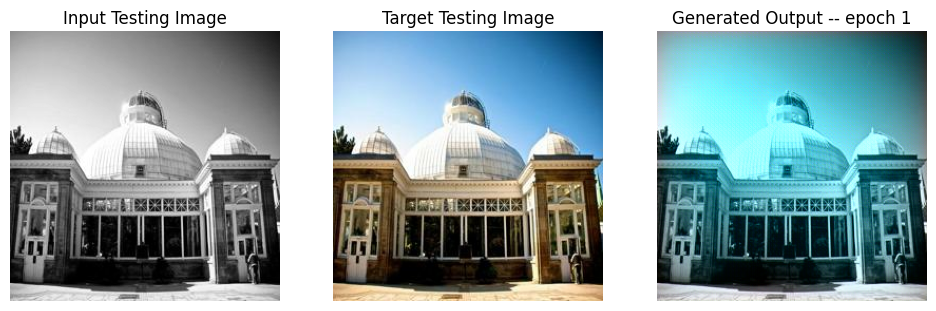

SSIM Score: 0.6582940220832825
PSNR Score: 15.938019752502441
Epoch 1
Training Details
Generator-- total_loss:6.57702 gan_loss:1.14087 l1_loss:0.04731 perceptual_loss:0.00882 Discriminator-- total_loss:1.22226 real_loss:0.59020 generated_loss:0.63206 --- SSIM 0.88698 PSNR 22.01076 LPIPS 0.00000
Time taken for epoch 2 is 605.1252584457397 sec
Number of iteration 500
Validation Details
Generator-- total_loss:11.76406 gan_loss:0.65967 l1_loss:0.10278  perceptual_loss:0.01033 Discriminator-- total_loss:1.65370 real_loss:1.03899 generated_loss:0.61471 --- SSIM 0.83370 PSNR 16.39269 LPIPS 0.00000
Time taken for epoch 2 is 646.3963413238525 sec
Number of iteration 63
Epoch 2
Training Details
Generator-- total_loss:6.38029 gan_loss:1.06814 l1_loss:0.04633 perceptual_loss:0.00849 Discriminator-- total_loss:1.25514 real_loss:0.60617 generated_loss:0.64897 --- SSIM 0.90555 PSNR 22.09949 LPIPS 0.00000
Time taken for epoch 3 is 615.5907080173492 sec
Number of iteration 500
Validation Details
Genera

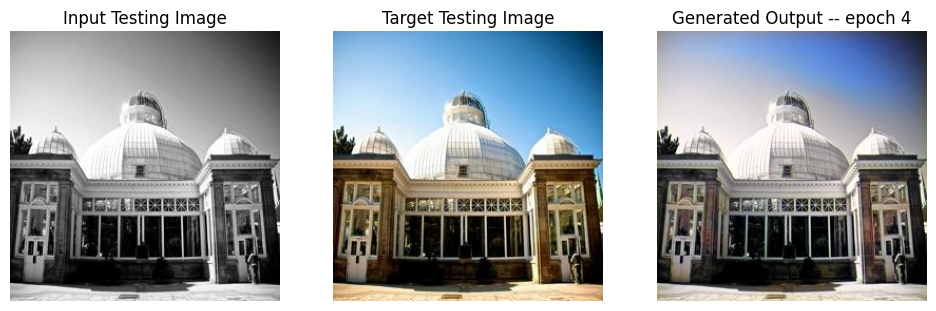

SSIM Score: 0.9350569844245911
PSNR Score: 21.831104278564453
Epoch 4
Training Details
Generator-- total_loss:6.36341 gan_loss:1.05670 l1_loss:0.04643 perceptual_loss:0.00830 Discriminator-- total_loss:1.29176 real_loss:0.63308 generated_loss:0.65867 --- SSIM 0.91072 PSNR 22.17070 LPIPS 0.00000
Time taken for epoch 5 is 607.7499341964722 sec
Number of iteration 500
Validation Details
Generator-- total_loss:15.07049 gan_loss:2.12260 l1_loss:0.12043  perceptual_loss:0.01131 Discriminator-- total_loss:1.13528 real_loss:0.31700 generated_loss:0.81828 --- SSIM 0.76232 PSNR 15.02965 LPIPS 0.00000
Time taken for epoch 5 is 648.9555308818817 sec
Number of iteration 63
Epoch 5
Training Details
Generator-- total_loss:6.32417 gan_loss:1.02655 l1_loss:0.04634 perceptual_loss:0.00830 Discriminator-- total_loss:1.28726 real_loss:0.63405 generated_loss:0.65322 --- SSIM 0.91166 PSNR 22.14149 LPIPS 0.00000
Time taken for epoch 6 is 612.0020208358765 sec
Number of iteration 500
Validation Details
Genera

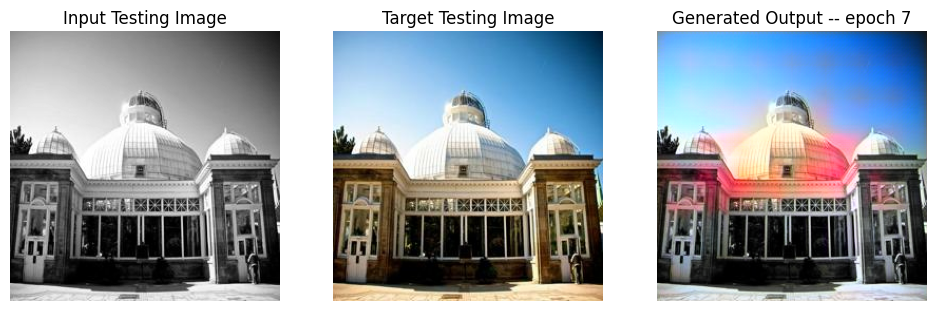

SSIM Score: 0.8947372436523438
PSNR Score: 19.5391902923584
Epoch 7
Training Details
Generator-- total_loss:6.29183 gan_loss:1.00956 l1_loss:0.04606 perceptual_loss:0.00845 Discriminator-- total_loss:1.26405 real_loss:0.61351 generated_loss:0.65054 --- SSIM 0.91207 PSNR 22.18769 LPIPS 0.00000
Time taken for epoch 8 is 612.8615741729736 sec
Number of iteration 500
Validation Details
Generator-- total_loss:6.28969 gan_loss:0.77757 l1_loss:0.04760  perceptual_loss:0.00940 Discriminator-- total_loss:1.32159 real_loss:0.70648 generated_loss:0.61510 --- SSIM 0.92550 PSNR 22.29675 LPIPS 0.00000
Time taken for epoch 8 is 654.2718963623047 sec
Number of iteration 63
Epoch 8
Training Details
Generator-- total_loss:6.29613 gan_loss:1.00486 l1_loss:0.04604 perceptual_loss:0.00858 Discriminator-- total_loss:1.25452 real_loss:0.60865 generated_loss:0.64587 --- SSIM 0.91016 PSNR 22.12789 LPIPS 0.00000
Time taken for epoch 9 is 608.7235651016235 sec
Number of iteration 500
Validation Details
Generator

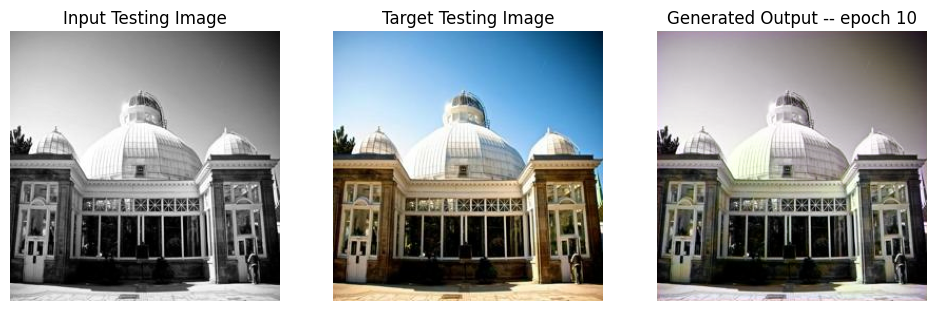

SSIM Score: 0.9323789477348328
PSNR Score: 18.30568504333496
Epoch 10
Training Details
Generator-- total_loss:4.88776 gan_loss:0.39273 l1_loss:0.03873 perceptual_loss:0.00778 Discriminator-- total_loss:2.16699 real_loss:1.39696 generated_loss:0.77003 --- SSIM 0.92830 PSNR 24.09692 LPIPS 0.00000
Time taken for epoch 11 is 552.8940463066101 sec
Number of iteration 500
Validation Details
Generator-- total_loss:5.42211 gan_loss:0.28865 l1_loss:0.04430  perceptual_loss:0.00879 Discriminator-- total_loss:2.40953 real_loss:1.57558 generated_loss:0.83395 --- SSIM 0.93045 PSNR 23.35034 LPIPS 0.00000
Time taken for epoch 11 is 594.0489604473114 sec
Number of iteration 63
Epoch 11
Training Details
Generator-- total_loss:13.23372 gan_loss:8.76109 l1_loss:0.03855 perceptual_loss:0.00772 Discriminator-- total_loss:0.02437 real_loss:0.01280 generated_loss:0.01157 --- SSIM 0.93045 PSNR 24.11507 LPIPS 0.00000
Time taken for epoch 12 is 417.95616579055786 sec
Number of iteration 500
Validation Details
G

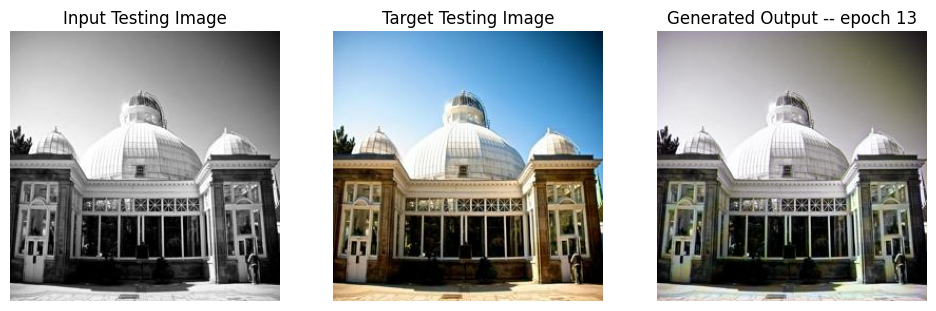

SSIM Score: 0.9313294887542725
PSNR Score: 18.210586547851562
Epoch 13
Training Details
Generator-- total_loss:16.60466 gan_loss:12.09251 l1_loss:0.03895 perceptual_loss:0.00771 Discriminator-- total_loss:0.00010 real_loss:0.00004 generated_loss:0.00006 --- SSIM 0.93054 PSNR 24.06445 LPIPS 0.00000
Time taken for epoch 14 is 416.8113236427307 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.99442 gan_loss:0.01791 l1_loss:0.04288  perceptual_loss:0.00861 Discriminator-- total_loss:6.30284 real_loss:6.30059 generated_loss:0.00225 --- SSIM 0.93248 PSNR 23.65637 LPIPS 0.00000
Time taken for epoch 14 is 457.5134494304657 sec
Number of iteration 63
Epoch 14
Training Details
Generator-- total_loss:17.29784 gan_loss:12.80945 l1_loss:0.03877 perceptual_loss:0.00765 Discriminator-- total_loss:0.00006 real_loss:0.00002 generated_loss:0.00003 --- SSIM 0.93068 PSNR 24.13522 LPIPS 0.00000
Time taken for epoch 15 is 417.3896412849426 sec
Number of iteration 500
Validation Detail

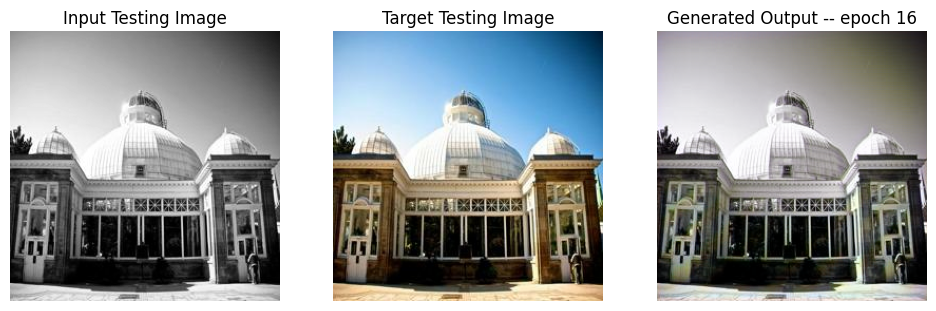

SSIM Score: 0.9314215779304504
PSNR Score: 18.205411911010742
Epoch 16
Training Details
Generator-- total_loss:18.45685 gan_loss:13.97177 l1_loss:0.03868 perceptual_loss:0.00771 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.93064 PSNR 24.09574 LPIPS 0.00000
Time taken for epoch 17 is 405.10291743278503 sec
Number of iteration 500
Validation Details
Generator-- total_loss:5.06815 gan_loss:0.00979 l1_loss:0.04368  perceptual_loss:0.00863 Discriminator-- total_loss:7.24545 real_loss:7.24435 generated_loss:0.00110 --- SSIM 0.93165 PSNR 23.64377 LPIPS 0.00000
Time taken for epoch 17 is 445.1676642894745 sec
Number of iteration 63
Epoch 17
Training Details
Generator-- total_loss:18.66339 gan_loss:14.20744 l1_loss:0.03844 perceptual_loss:0.00764 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.93079 PSNR 24.16251 LPIPS 0.00000
Time taken for epoch 18 is 399.19339394569397 sec
Number of iteration 500
Validation Deta

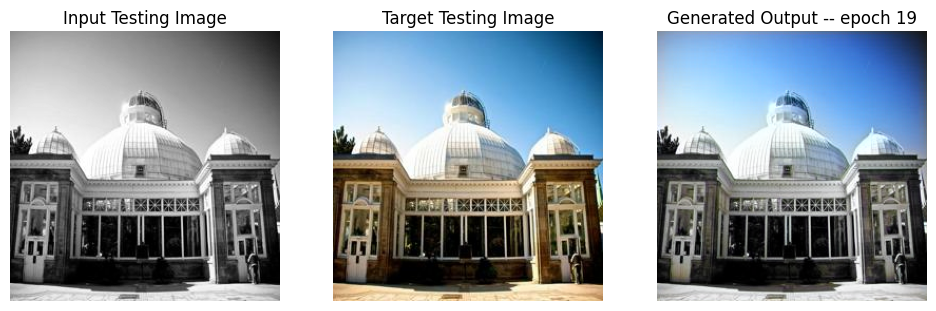

SSIM Score: 0.9442970156669617
PSNR Score: 24.18267250061035
Epoch 19
Training Details
Generator-- total_loss:4.30686 gan_loss:0.01505 l1_loss:0.03698 perceptual_loss:0.00743 Discriminator-- total_loss:9.45146 real_loss:9.45146 generated_loss:0.00001 --- SSIM 0.94051 PSNR 24.30819 LPIPS 0.00000
Time taken for epoch 20 is 536.0089156627655 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.64600 gan_loss:0.00004 l1_loss:0.03990  perceptual_loss:0.00820 Discriminator-- total_loss:13.58407 real_loss:13.58401 generated_loss:0.00007 --- SSIM 0.94302 PSNR 24.16982 LPIPS 0.00000
Time taken for epoch 20 is 576.6451823711395 sec
Number of iteration 63
Epoch 20
Training Details
Generator-- total_loss:4.24644 gan_loss:0.01458 l1_loss:0.03646 perceptual_loss:0.00732 Discriminator-- total_loss:9.48304 real_loss:9.48304 generated_loss:0.00001 --- SSIM 0.94161 PSNR 24.42288 LPIPS 0.00000
Time taken for epoch 21 is 535.8710656166077 sec
Number of iteration 500
Validation Details
G

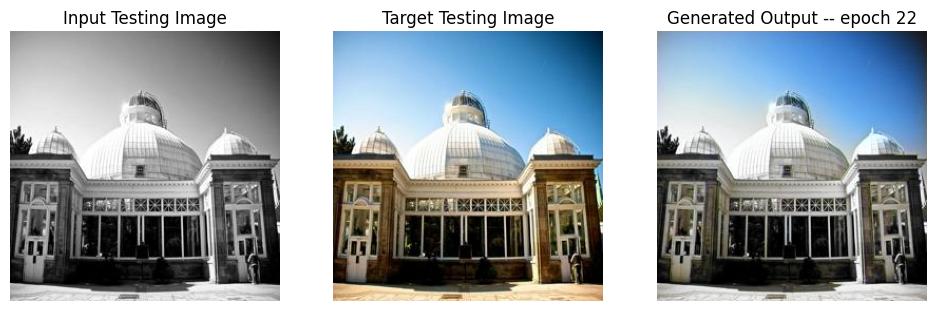

SSIM Score: 0.9580180048942566
PSNR Score: 25.195899963378906
Epoch 22
Training Details
Generator-- total_loss:4.29698 gan_loss:0.01366 l1_loss:0.03699 perceptual_loss:0.00730 Discriminator-- total_loss:9.44382 real_loss:9.44381 generated_loss:0.00001 --- SSIM 0.94060 PSNR 24.33826 LPIPS 0.00000
Time taken for epoch 23 is 535.7508928775787 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.63902 gan_loss:0.00004 l1_loss:0.03979  perceptual_loss:0.00825 Discriminator-- total_loss:13.35704 real_loss:13.35698 generated_loss:0.00005 --- SSIM 0.94259 PSNR 24.11250 LPIPS 0.00000
Time taken for epoch 23 is 575.4255278110504 sec
Number of iteration 63
Epoch 23
Training Details
Generator-- total_loss:4.25036 gan_loss:0.01168 l1_loss:0.03658 perceptual_loss:0.00725 Discriminator-- total_loss:9.20048 real_loss:9.20047 generated_loss:0.00001 --- SSIM 0.94105 PSNR 24.41030 LPIPS 0.00000
Time taken for epoch 24 is 536.0919687747955 sec
Number of iteration 500
Validation Details


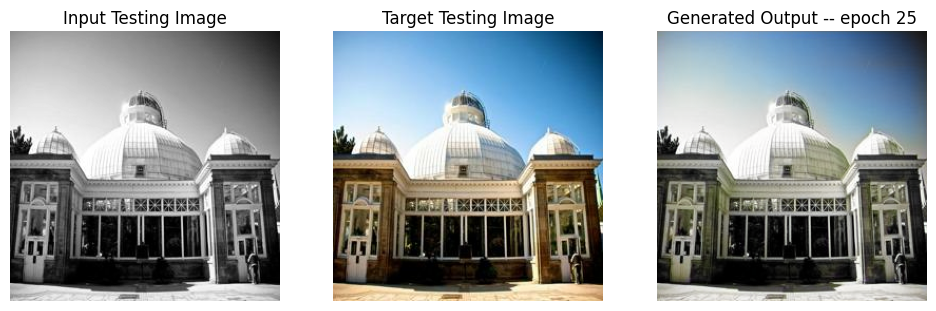

SSIM Score: 0.9552276730537415
PSNR Score: 22.850759506225586
Epoch 25
Training Details
Generator-- total_loss:4.24200 gan_loss:0.01240 l1_loss:0.03649 perceptual_loss:0.00726 Discriminator-- total_loss:9.43372 real_loss:9.43371 generated_loss:0.00001 --- SSIM 0.94140 PSNR 24.41132 LPIPS 0.00000
Time taken for epoch 26 is 540.2032608985901 sec
Number of iteration 500
Validation Details
Generator-- total_loss:6.24339 gan_loss:0.00004 l1_loss:0.05569  perceptual_loss:0.00843 Discriminator-- total_loss:18.39603 real_loss:18.39597 generated_loss:0.00006 --- SSIM 0.92721 PSNR 21.70356 LPIPS 0.00000
Time taken for epoch 26 is 579.721387386322 sec
Number of iteration 63
Epoch 26
Training Details
Generator-- total_loss:4.25197 gan_loss:0.01006 l1_loss:0.03659 perceptual_loss:0.00729 Discriminator-- total_loss:9.02738 real_loss:9.02737 generated_loss:0.00001 --- SSIM 0.94107 PSNR 24.39404 LPIPS 0.00000
Time taken for epoch 27 is 539.9458658695221 sec
Number of iteration 500
Validation Details
G

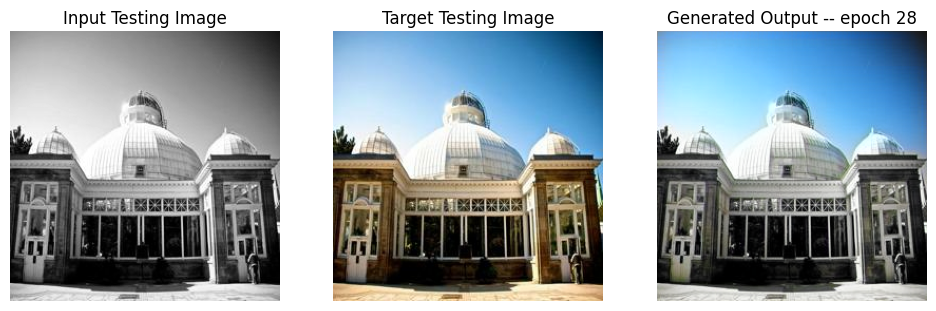

SSIM Score: 0.9545935988426208
PSNR Score: 24.362335205078125
Epoch 28
Training Details
Generator-- total_loss:4.20564 gan_loss:0.01044 l1_loss:0.03621 perceptual_loss:0.00718 Discriminator-- total_loss:9.05786 real_loss:9.05785 generated_loss:0.00001 --- SSIM 0.94214 PSNR 24.48320 LPIPS 0.00000
Time taken for epoch 29 is 537.1729156970978 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.89665 gan_loss:0.00004 l1_loss:0.04255  perceptual_loss:0.00801 Discriminator-- total_loss:14.48527 real_loss:14.48522 generated_loss:0.00005 --- SSIM 0.93898 PSNR 23.44240 LPIPS 0.00000
Time taken for epoch 29 is 577.0841743946075 sec
Number of iteration 63
Epoch 29
Training Details
Generator-- total_loss:4.26461 gan_loss:0.01078 l1_loss:0.03674 perceptual_loss:0.00724 Discriminator-- total_loss:9.20351 real_loss:9.20350 generated_loss:0.00001 --- SSIM 0.94120 PSNR 24.37115 LPIPS 0.00000
Time taken for epoch 30 is 538.2974486351013 sec
Number of iteration 500
Validation Details


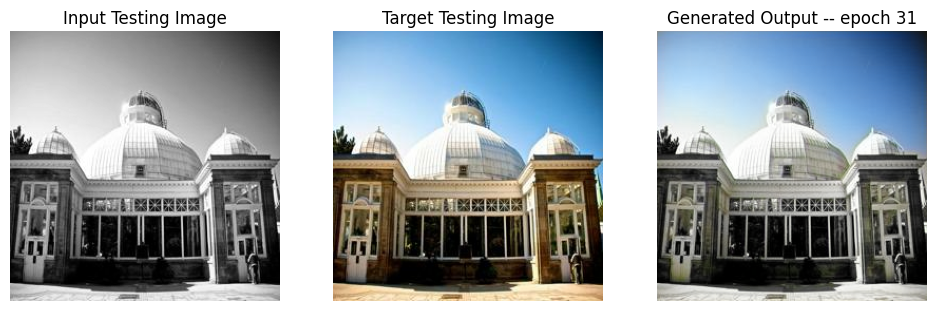

SSIM Score: 0.9609622359275818
PSNR Score: 25.21918487548828
Epoch 31
Training Details
Generator-- total_loss:13.77516 gan_loss:9.60473 l1_loss:0.03595 perceptual_loss:0.00719 Discriminator-- total_loss:0.00136 real_loss:0.00066 generated_loss:0.00070 --- SSIM 0.94283 PSNR 24.57741 LPIPS 0.00000
Time taken for epoch 32 is 401.8975269794464 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.67560 gan_loss:0.03807 l1_loss:0.03964  perceptual_loss:0.00842 Discriminator-- total_loss:4.46710 real_loss:4.43537 generated_loss:0.03174 --- SSIM 0.94196 PSNR 24.11960 LPIPS 0.00000
Time taken for epoch 32 is 441.4539358615875 sec
Number of iteration 63
Epoch 32
Training Details
Generator-- total_loss:15.17573 gan_loss:11.00168 l1_loss:0.03593 perceptual_loss:0.00727 Discriminator-- total_loss:0.00044 real_loss:0.00021 generated_loss:0.00023 --- SSIM 0.94285 PSNR 24.58170 LPIPS 0.00000
Time taken for epoch 33 is 403.33073019981384 sec
Number of iteration 500
Validation Details

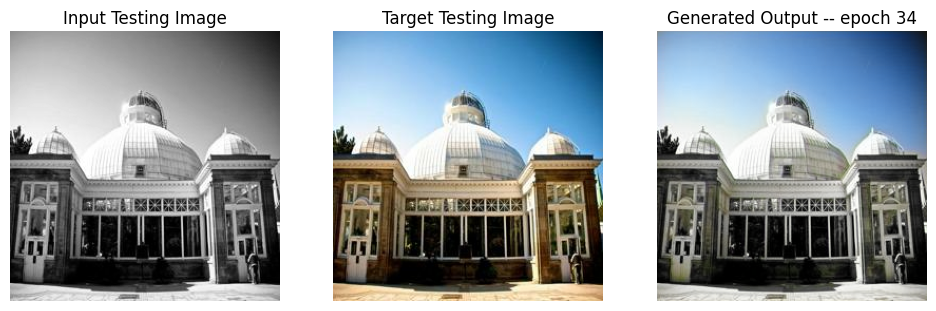

SSIM Score: 0.9609384536743164
PSNR Score: 25.207551956176758
Epoch 34
Training Details
Generator-- total_loss:15.29347 gan_loss:11.11020 l1_loss:0.03605 perceptual_loss:0.00723 Discriminator-- total_loss:0.01848 real_loss:0.01380 generated_loss:0.00468 --- SSIM 0.94293 PSNR 24.53697 LPIPS 0.00000
Time taken for epoch 35 is 403.13042187690735 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.75307 gan_loss:0.14826 l1_loss:0.03944  perceptual_loss:0.00827 Discriminator-- total_loss:3.21107 real_loss:3.11853 generated_loss:0.09254 --- SSIM 0.94181 PSNR 24.25516 LPIPS 0.00000
Time taken for epoch 35 is 442.94198513031006 sec
Number of iteration 63
Epoch 35
Training Details
Generator-- total_loss:14.97206 gan_loss:10.77506 l1_loss:0.03622 perceptual_loss:0.00718 Discriminator-- total_loss:0.00368 real_loss:0.00228 generated_loss:0.00140 --- SSIM 0.94251 PSNR 24.52709 LPIPS 0.00000
Time taken for epoch 36 is 402.5161681175232 sec
Number of iteration 500
Validation Deta

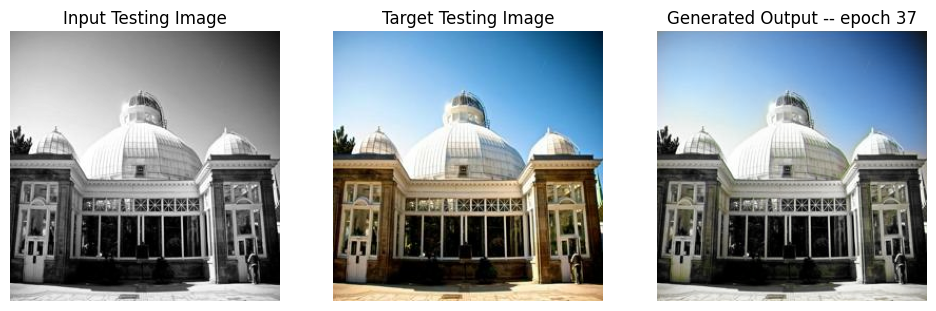

SSIM Score: 0.961096465587616
PSNR Score: 25.230525970458984
Reduced generator learning rate to 0.0002025000096182339 at epoch 37
Epoch 37
Training Details
Generator-- total_loss:4.53384 gan_loss:0.06495 l1_loss:0.03886 perceptual_loss:0.00729 Discriminator-- total_loss:7.55137 real_loss:7.55124 generated_loss:0.00013 --- SSIM 0.93423 PSNR 23.67368 LPIPS 0.00000
Time taken for epoch 38 is 535.7351503372192 sec
Number of iteration 500
Validation Details
Generator-- total_loss:5.10230 gan_loss:0.00013 l1_loss:0.04451  perceptual_loss:0.00814 Discriminator-- total_loss:13.41636 real_loss:13.41612 generated_loss:0.00024 --- SSIM 0.93162 PSNR 23.02933 LPIPS 0.00000
Time taken for epoch 38 is 575.2498180866241 sec
Number of iteration 63
Epoch 38
Training Details
Generator-- total_loss:4.40807 gan_loss:0.03044 l1_loss:0.03799 perceptual_loss:0.00723 Discriminator-- total_loss:7.58322 real_loss:7.58307 generated_loss:0.00015 --- SSIM 0.93666 PSNR 23.85339 LPIPS 0.00000
Time taken for epoch 39 

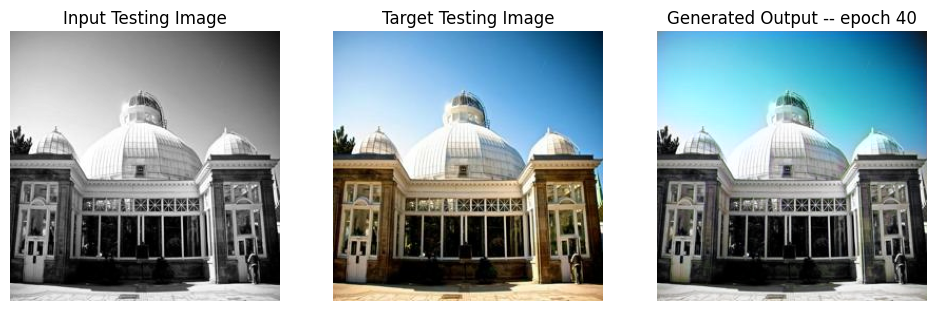

SSIM Score: 0.9151036143302917
PSNR Score: 23.072383880615234
Epoch 40
Training Details
Generator-- total_loss:4.36622 gan_loss:0.03078 l1_loss:0.03763 perceptual_loss:0.00716 Discriminator-- total_loss:7.61079 real_loss:7.61072 generated_loss:0.00007 --- SSIM 0.93690 PSNR 23.95492 LPIPS 0.00000
Time taken for epoch 41 is 544.0228092670441 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.81079 gan_loss:0.00008 l1_loss:0.04147  perceptual_loss:0.00829 Discriminator-- total_loss:13.28504 real_loss:13.28479 generated_loss:0.00026 --- SSIM 0.93664 PSNR 23.67293 LPIPS 0.00000
Time taken for epoch 41 is 588.2982420921326 sec
Number of iteration 63
Epoch 41
Training Details
Generator-- total_loss:4.38876 gan_loss:0.02675 l1_loss:0.03785 perceptual_loss:0.00721 Discriminator-- total_loss:7.28750 real_loss:7.28744 generated_loss:0.00007 --- SSIM 0.93674 PSNR 23.90561 LPIPS 0.00000
Time taken for epoch 42 is 588.8361215591431 sec
Number of iteration 500
Validation Details


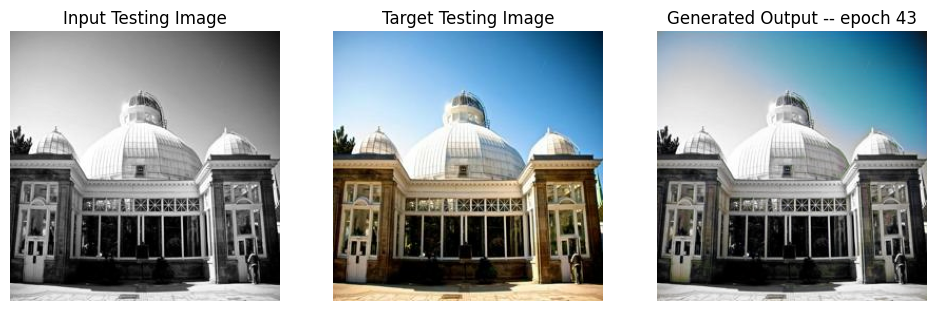

SSIM Score: 0.9480195045471191
PSNR Score: 23.258031845092773
Epoch 43
Training Details
Generator-- total_loss:4.36223 gan_loss:0.02813 l1_loss:0.03763 perceptual_loss:0.00714 Discriminator-- total_loss:7.31066 real_loss:7.30843 generated_loss:0.00223 --- SSIM 0.93687 PSNR 23.93187 LPIPS 0.00000
Time taken for epoch 44 is 592.7957847118378 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.95661 gan_loss:0.00009 l1_loss:0.04323  perceptual_loss:0.00792 Discriminator-- total_loss:13.76691 real_loss:13.76666 generated_loss:0.00025 --- SSIM 0.93210 PSNR 22.91429 LPIPS 0.00000
Time taken for epoch 44 is 637.9303357601166 sec
Number of iteration 63
Epoch 44
Training Details
Generator-- total_loss:4.34351 gan_loss:0.02724 l1_loss:0.03745 perceptual_loss:0.00714 Discriminator-- total_loss:7.26858 real_loss:7.26814 generated_loss:0.00044 --- SSIM 0.93737 PSNR 23.98928 LPIPS 0.00000
Time taken for epoch 45 is 583.3487777709961 sec
Number of iteration 500
Validation Details


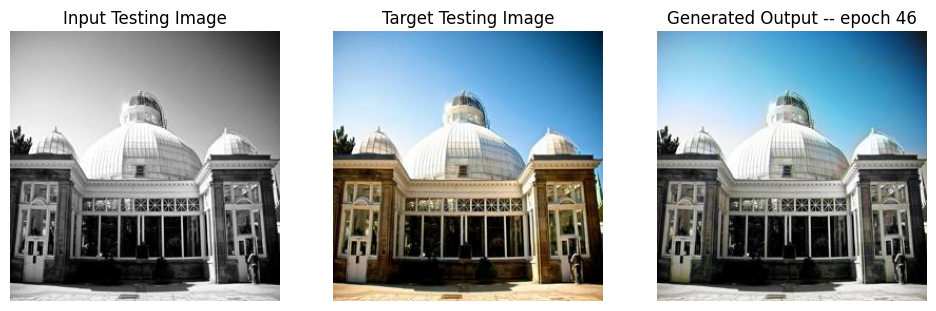

SSIM Score: 0.9424058794975281
PSNR Score: 25.50111198425293
Epoch 46
Training Details
Generator-- total_loss:11.77708 gan_loss:7.47504 l1_loss:0.03731 perceptual_loss:0.00713 Discriminator-- total_loss:0.03473 real_loss:0.01270 generated_loss:0.02204 --- SSIM 0.93837 PSNR 24.00346 LPIPS 0.00000
Time taken for epoch 47 is 455.96162390708923 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.70694 gan_loss:0.01856 l1_loss:0.04041  perceptual_loss:0.00810 Discriminator-- total_loss:5.32521 real_loss:5.29528 generated_loss:0.02993 --- SSIM 0.93910 PSNR 23.74053 LPIPS 0.00000
Time taken for epoch 47 is 500.5074415206909 sec
Number of iteration 63
Epoch 47
Training Details
Generator-- total_loss:12.59991 gan_loss:8.28666 l1_loss:0.03742 perceptual_loss:0.00714 Discriminator-- total_loss:0.01306 real_loss:0.00518 generated_loss:0.00788 --- SSIM 0.93791 PSNR 23.93641 LPIPS 0.00000
Time taken for epoch 48 is 447.83250069618225 sec
Number of iteration 500
Validation Details

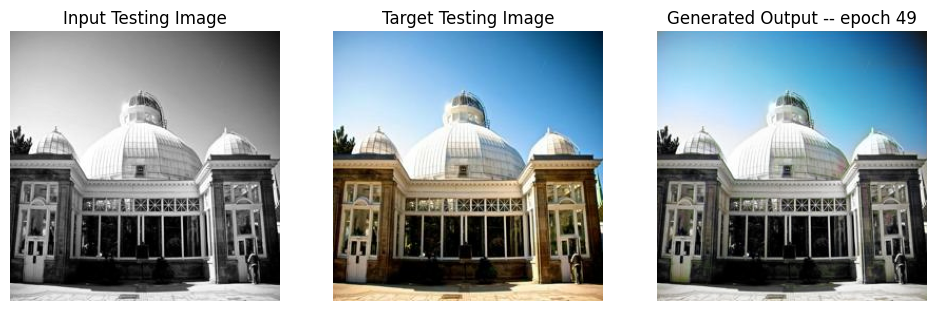

SSIM Score: 0.9435990452766418
PSNR Score: 25.532564163208008
Epoch 49
Training Details
Generator-- total_loss:12.86776 gan_loss:8.51590 l1_loss:0.03776 perceptual_loss:0.00720 Discriminator-- total_loss:0.01180 real_loss:0.00524 generated_loss:0.00656 --- SSIM 0.93753 PSNR 23.88648 LPIPS 0.00000
Time taken for epoch 50 is 458.3907778263092 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.81105 gan_loss:0.00527 l1_loss:0.04177  perceptual_loss:0.00786 Discriminator-- total_loss:7.15842 real_loss:7.14570 generated_loss:0.01272 --- SSIM 0.93773 PSNR 23.58079 LPIPS 0.00000
Time taken for epoch 50 is 504.93871212005615 sec
Number of iteration 63
Epoch 50
Training Details
Generator-- total_loss:12.90459 gan_loss:8.62346 l1_loss:0.03711 perceptual_loss:0.00713 Discriminator-- total_loss:0.01154 real_loss:0.00413 generated_loss:0.00741 --- SSIM 0.93793 PSNR 24.00262 LPIPS 0.00000
Time taken for epoch 51 is 464.1680557727814 sec
Number of iteration 500
Validation Details

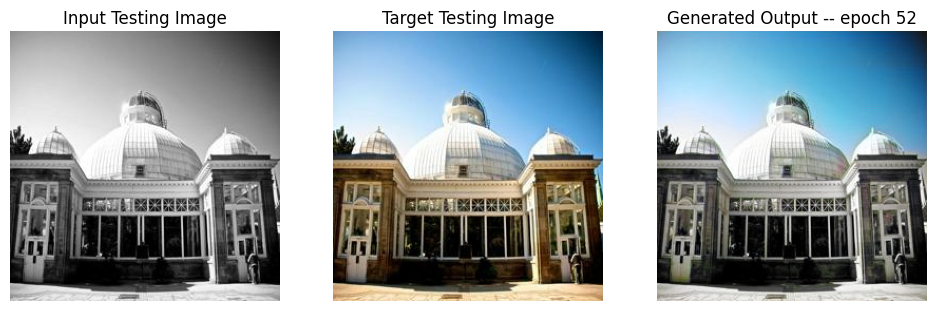

SSIM Score: 0.9430362582206726
PSNR Score: 25.520299911499023
Epoch 52
Training Details
Generator-- total_loss:14.31914 gan_loss:10.02991 l1_loss:0.03721 perceptual_loss:0.00711 Discriminator-- total_loss:0.00360 real_loss:0.00171 generated_loss:0.00189 --- SSIM 0.93840 PSNR 23.98825 LPIPS 0.00000
Time taken for epoch 53 is 456.70179557800293 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.86643 gan_loss:0.00277 l1_loss:0.04211  perceptual_loss:0.00816 Discriminator-- total_loss:7.85016 real_loss:7.84153 generated_loss:0.00864 --- SSIM 0.93518 PSNR 23.45094 LPIPS 0.00000
Time taken for epoch 53 is 502.6971867084503 sec
Number of iteration 63
Epoch 53
Training Details
Generator-- total_loss:14.18324 gan_loss:9.86591 l1_loss:0.03746 perceptual_loss:0.00714 Discriminator-- total_loss:0.01541 real_loss:0.00874 generated_loss:0.00668 --- SSIM 0.93738 PSNR 23.93791 LPIPS 0.00000
Time taken for epoch 54 is 446.9113154411316 sec
Number of iteration 500
Validation Detail

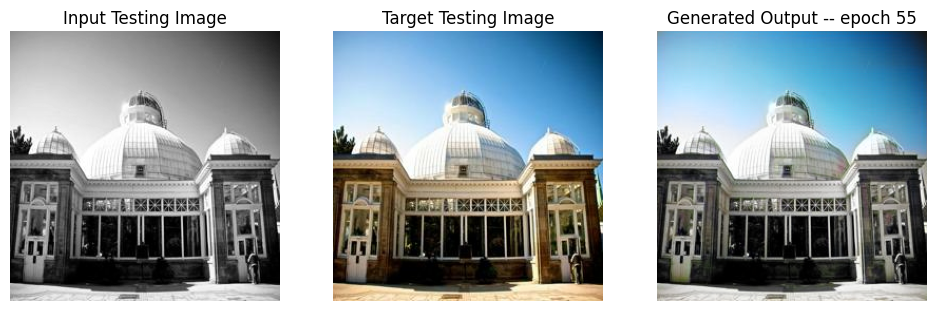

SSIM Score: 0.9427711367607117
PSNR Score: 25.50489044189453
Epoch 55
Training Details
Generator-- total_loss:14.90077 gan_loss:10.63385 l1_loss:0.03695 perceptual_loss:0.00715 Discriminator-- total_loss:0.00157 real_loss:0.00070 generated_loss:0.00087 --- SSIM 0.93820 PSNR 24.04355 LPIPS 0.00000
Time taken for epoch 56 is 446.3291597366333 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.81934 gan_loss:0.00251 l1_loss:0.04167  perceptual_loss:0.00812 Discriminator-- total_loss:8.38034 real_loss:8.37466 generated_loss:0.00567 --- SSIM 0.93789 PSNR 23.54271 LPIPS 0.00000
Time taken for epoch 56 is 492.06276631355286 sec
Number of iteration 63
Epoch 56
Training Details
Generator-- total_loss:15.45147 gan_loss:11.17244 l1_loss:0.03710 perceptual_loss:0.00711 Discriminator-- total_loss:0.01479 real_loss:0.00666 generated_loss:0.00812 --- SSIM 0.93829 PSNR 24.01484 LPIPS 0.00000
Time taken for epoch 57 is 447.1115093231201 sec
Number of iteration 500
Validation Detail

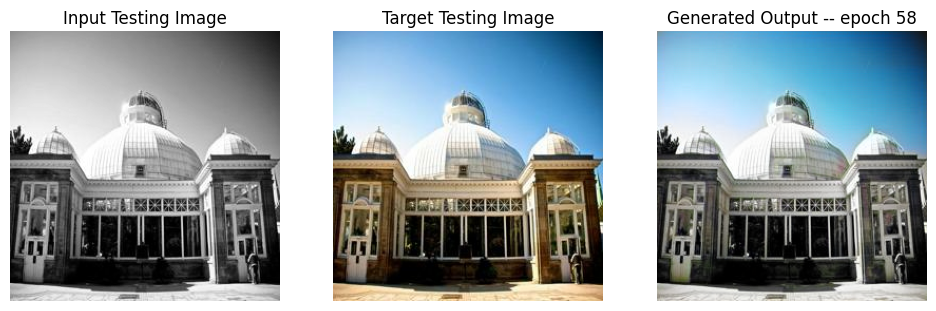

SSIM Score: 0.9424159526824951
PSNR Score: 25.49602508544922
Epoch 58
Training Details
Generator-- total_loss:14.80050 gan_loss:10.48256 l1_loss:0.03744 perceptual_loss:0.00718 Discriminator-- total_loss:0.00373 real_loss:0.00153 generated_loss:0.00220 --- SSIM 0.93786 PSNR 23.96575 LPIPS 0.00000
Time taken for epoch 59 is 447.3947641849518 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.80105 gan_loss:0.00202 l1_loss:0.04147  perceptual_loss:0.00815 Discriminator-- total_loss:8.47708 real_loss:8.47223 generated_loss:0.00485 --- SSIM 0.93787 PSNR 23.57034 LPIPS 0.00000
Time taken for epoch 59 is 493.30001997947693 sec
Number of iteration 63
Epoch 59
Training Details
Generator-- total_loss:15.25276 gan_loss:10.96627 l1_loss:0.03717 perceptual_loss:0.00712 Discriminator-- total_loss:0.00168 real_loss:0.00076 generated_loss:0.00092 --- SSIM 0.93807 PSNR 24.02441 LPIPS 0.00000
Time taken for epoch 60 is 446.7470827102661 sec
Number of iteration 500
Validation Detail

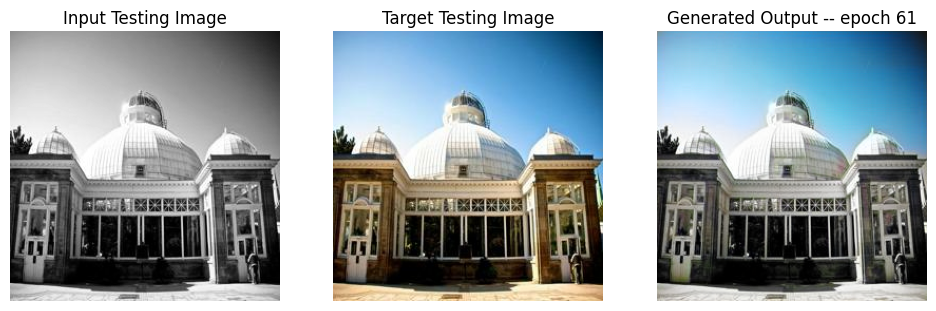

SSIM Score: 0.9433692097663879
PSNR Score: 25.536184310913086
Epoch 61
Training Details
Generator-- total_loss:15.57321 gan_loss:11.28541 l1_loss:0.03718 perceptual_loss:0.00712 Discriminator-- total_loss:0.00129 real_loss:0.00063 generated_loss:0.00067 --- SSIM 0.93817 PSNR 24.02050 LPIPS 0.00000
Time taken for epoch 62 is 449.8470540046692 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.83637 gan_loss:0.00097 l1_loss:0.04184  perceptual_loss:0.00815 Discriminator-- total_loss:9.06784 real_loss:9.06456 generated_loss:0.00328 --- SSIM 0.93809 PSNR 23.64033 LPIPS 0.00000
Time taken for epoch 62 is 495.40516114234924 sec
Number of iteration 63
Epoch 62
Training Details
Generator-- total_loss:15.94591 gan_loss:11.60405 l1_loss:0.03771 perceptual_loss:0.00714 Discriminator-- total_loss:0.00269 real_loss:0.00153 generated_loss:0.00116 --- SSIM 0.93730 PSNR 23.91943 LPIPS 0.00000
Time taken for epoch 63 is 444.5041298866272 sec
Number of iteration 500
Validation Detai

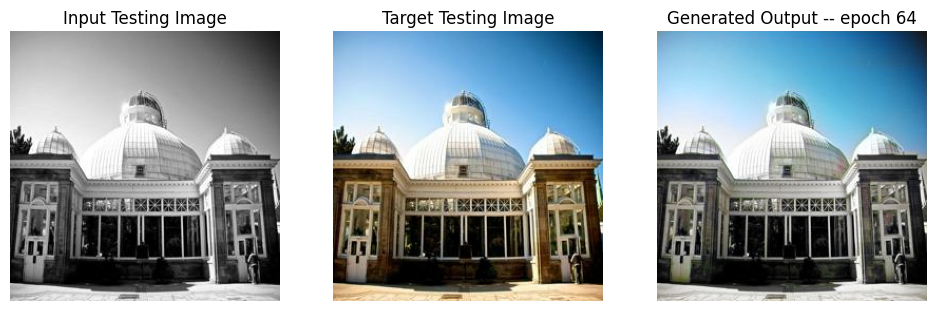

SSIM Score: 0.9440919756889343
PSNR Score: 25.565412521362305
Reduced generator learning rate to 9.11250062927138e-05 at epoch 64
Epoch 64
Training Details
Generator-- total_loss:4.46841 gan_loss:0.06678 l1_loss:0.03822 perceptual_loss:0.00725 Discriminator-- total_loss:9.40162 real_loss:9.40142 generated_loss:0.00020 --- SSIM 0.93586 PSNR 23.92812 LPIPS 0.00000
Time taken for epoch 65 is 585.6486876010895 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.68510 gan_loss:0.00003 l1_loss:0.04038  perceptual_loss:0.00809 Discriminator-- total_loss:15.36076 real_loss:15.36064 generated_loss:0.00012 --- SSIM 0.93887 PSNR 23.98965 LPIPS 0.00000
Time taken for epoch 65 is 630.8252189159393 sec
Number of iteration 63
Epoch 65
Training Details
Generator-- total_loss:4.34958 gan_loss:0.02201 l1_loss:0.03751 perceptual_loss:0.00720 Discriminator-- total_loss:8.76677 real_loss:8.76545 generated_loss:0.00132 --- SSIM 0.93706 PSNR 24.10335 LPIPS 0.00000
Time taken for epoch 66 

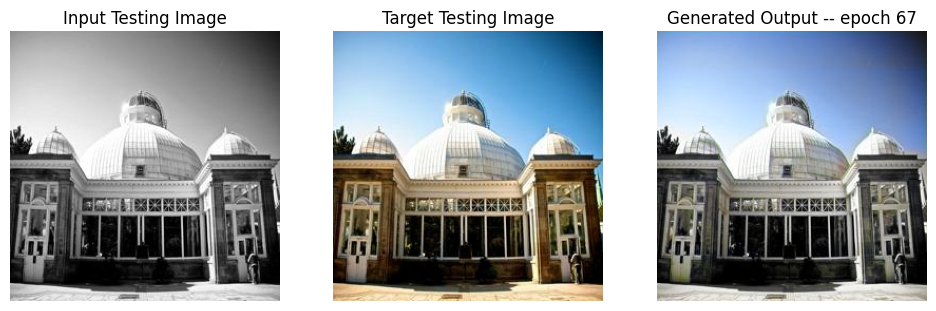

SSIM Score: 0.9517490267753601
PSNR Score: 24.12415313720703
Epoch 67
Training Details
Generator-- total_loss:4.30733 gan_loss:0.02162 l1_loss:0.03705 perceptual_loss:0.00726 Discriminator-- total_loss:8.16862 real_loss:8.16619 generated_loss:0.00243 --- SSIM 0.93666 PSNR 24.14616 LPIPS 0.00000
Time taken for epoch 68 is 571.0687055587769 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.71174 gan_loss:0.00005 l1_loss:0.04070  perceptual_loss:0.00803 Discriminator-- total_loss:14.21057 real_loss:14.21040 generated_loss:0.00017 --- SSIM 0.94053 PSNR 23.90370 LPIPS 0.00000
Time taken for epoch 68 is 615.9207801818848 sec
Number of iteration 63
Epoch 68
Training Details
Generator-- total_loss:4.28913 gan_loss:0.02113 l1_loss:0.03691 perceptual_loss:0.00721 Discriminator-- total_loss:8.33521 real_loss:8.33453 generated_loss:0.00068 --- SSIM 0.93731 PSNR 24.15032 LPIPS 0.00000
Time taken for epoch 69 is 575.3356516361237 sec
Number of iteration 500
Validation Details
G

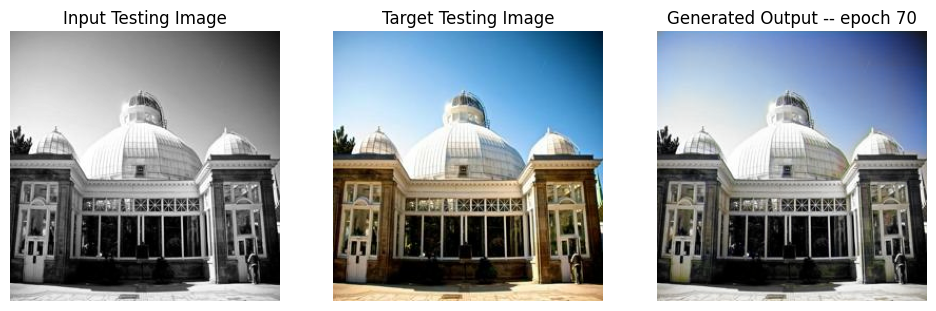

SSIM Score: 0.9514899253845215
PSNR Score: 23.53749656677246
Epoch 70
Training Details
Generator-- total_loss:4.23585 gan_loss:0.02054 l1_loss:0.03646 perceptual_loss:0.00711 Discriminator-- total_loss:8.00639 real_loss:8.00425 generated_loss:0.00214 --- SSIM 0.93793 PSNR 24.25508 LPIPS 0.00000
Time taken for epoch 71 is 576.2114140987396 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.72057 gan_loss:0.00005 l1_loss:0.04082  perceptual_loss:0.00798 Discriminator-- total_loss:14.80517 real_loss:14.80495 generated_loss:0.00022 --- SSIM 0.93853 PSNR 23.84088 LPIPS 0.00000
Time taken for epoch 71 is 621.0073471069336 sec
Number of iteration 63
Epoch 71
Training Details
Generator-- total_loss:4.27083 gan_loss:0.02417 l1_loss:0.03666 perceptual_loss:0.00726 Discriminator-- total_loss:8.00121 real_loss:7.99956 generated_loss:0.00165 --- SSIM 0.93748 PSNR 24.17434 LPIPS 0.00000
Time taken for epoch 72 is 576.2109467983246 sec
Number of iteration 500
Validation Details
G

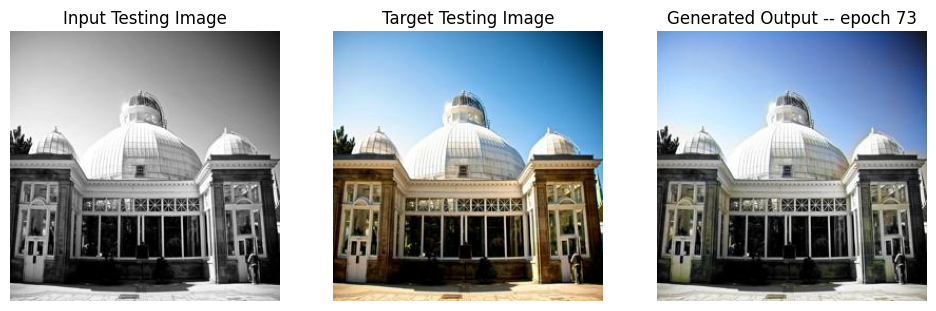

SSIM Score: 0.9523286819458008
PSNR Score: 24.705766677856445
Epoch 73
Training Details
Generator-- total_loss:4.26608 gan_loss:0.01950 l1_loss:0.03668 perceptual_loss:0.00723 Discriminator-- total_loss:7.94400 real_loss:7.94388 generated_loss:0.00012 --- SSIM 0.93785 PSNR 24.19721 LPIPS 0.00000
Time taken for epoch 74 is 580.0403604507446 sec
Number of iteration 500
Validation Details
Generator-- total_loss:4.79551 gan_loss:0.00005 l1_loss:0.04146  perceptual_loss:0.00811 Discriminator-- total_loss:15.23887 real_loss:15.23872 generated_loss:0.00015 --- SSIM 0.93911 PSNR 23.63899 LPIPS 0.00000
Time taken for epoch 74 is 624.7792086601257 sec
Number of iteration 63
Epoch 74
Training Details
Generator-- total_loss:4.30510 gan_loss:0.01909 l1_loss:0.03708 perceptual_loss:0.00722 Discriminator-- total_loss:7.96165 real_loss:7.96073 generated_loss:0.00092 --- SSIM 0.93640 PSNR 24.10230 LPIPS 0.00000
Time taken for epoch 75 is 580.1112205982208 sec
Number of iteration 500
Validation Details


In [50]:
fit(train_dataset, epochs, val, gen)

/tmp/ipykernel_26/1385076028.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, train_discriminator_losses, '-or', color='orange', label='Discriminator Loss')


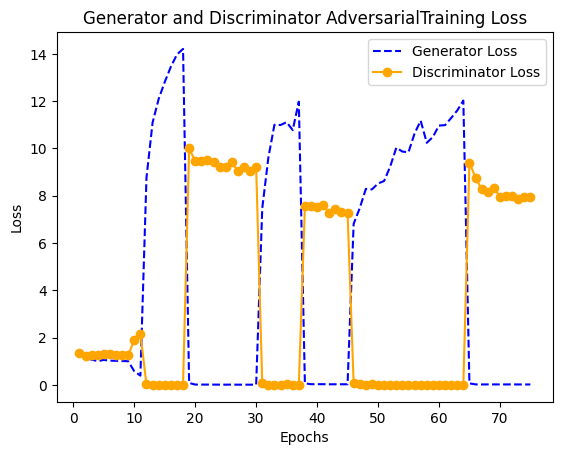

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-or', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator AdversarialTraining Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

/tmp/ipykernel_26/4010479747.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_discriminator_losses, '-or', color='orange', label='Discriminator Loss')


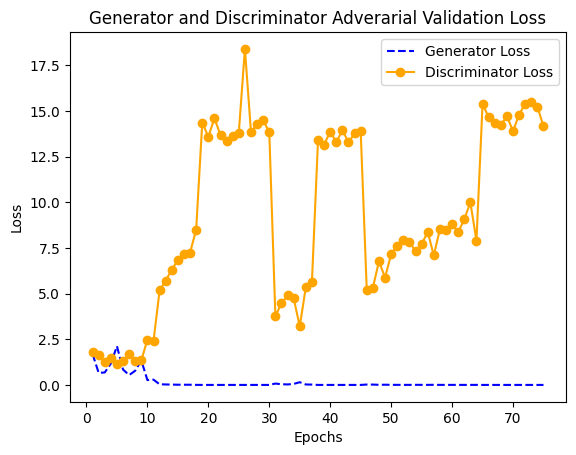

In [52]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-or', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator Adverarial Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

/tmp/ipykernel_26/825315398.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, testing_ssim, '-or', color='orange', label='Validation SSIM')


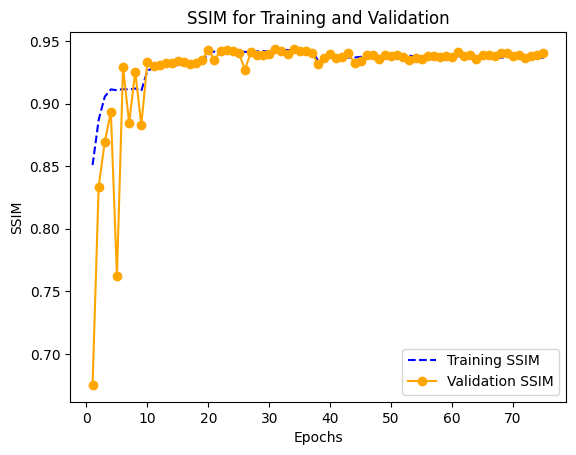

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-or', color='orange', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

/tmp/ipykernel_26/1818322218.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, testing_psnr, '-or', color='orange', label='Validation PSNR')


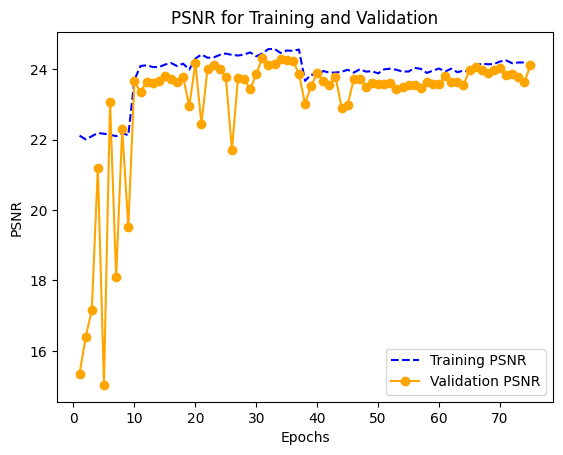

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-or', color='orange', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

/tmp/ipykernel_26/136468053.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, testing_lpips, '-or', color='orange', label='Validation LPIPS')


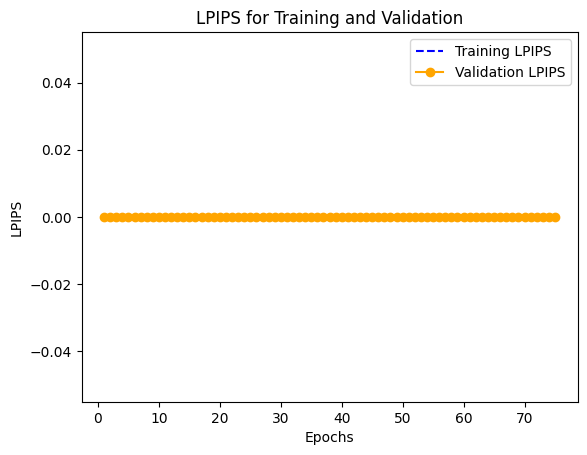

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-or', color='orange', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

/tmp/ipykernel_26/3235268261.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_generator_gan_losses,'-or', color='orange', label='Validation_Generator_GAN_Loss')


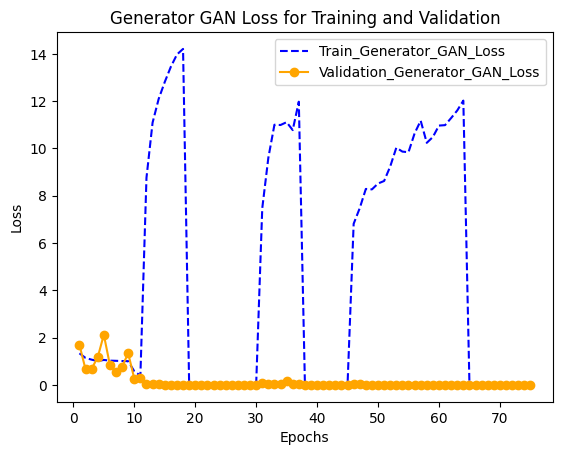

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses,'-or', color='orange', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

/tmp/ipykernel_26/271018654.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_generator_l1_losses, '-or', color='orange', label='Validation_Generator_L1_Loss')


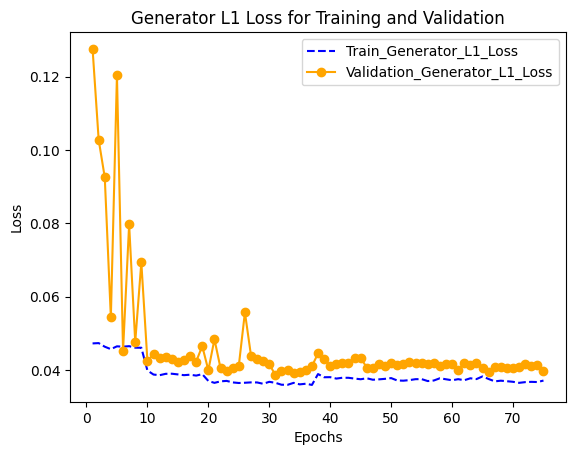

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-or', color='orange', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

/tmp/ipykernel_26/1114805691.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_generator_perceptual_losses, '-or', color='orange', label='Validation_Generator_Perceptual_Loss')


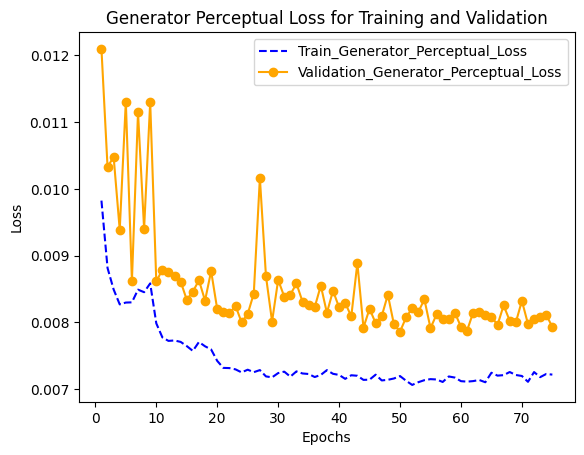

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-or', color='orange', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

/tmp/ipykernel_26/1582919640.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_generator_losses, '-or', color='orange', label='Validation_Generator_Loss')


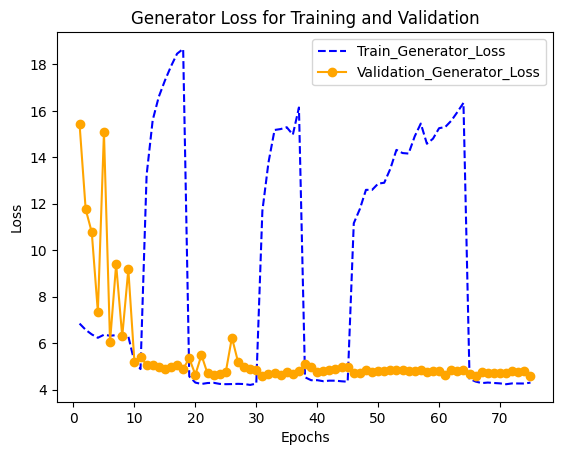

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-or', color='orange', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

/tmp/ipykernel_26/1374437368.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_discriminator_losses, '-or', color='orange', label='Validation_Discriminator_Loss')


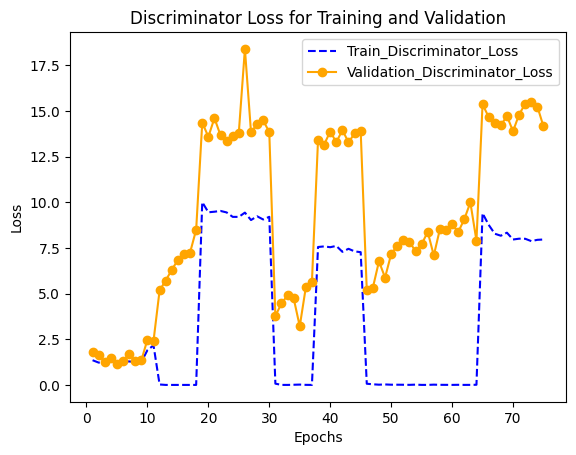

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-or', color='orange', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

/tmp/ipykernel_26/1497767744.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_discriminator_real_losses, '-or', color='orange', label='Validation_Discriminator_Real_Loss')


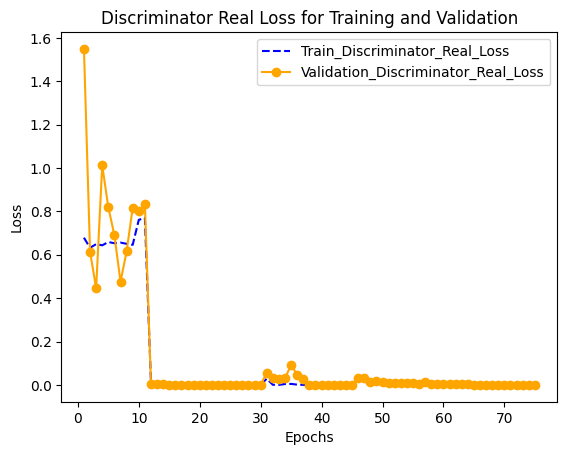

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-or', color='orange', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

/tmp/ipykernel_26/1197813443.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-or" (-> color='r'). The keyword argument will take precedence.
  plt.plot(epochs, test_discriminator_generated_losses,'-or', color='orange', label='Validation_Discriminator_Generated_Loss')


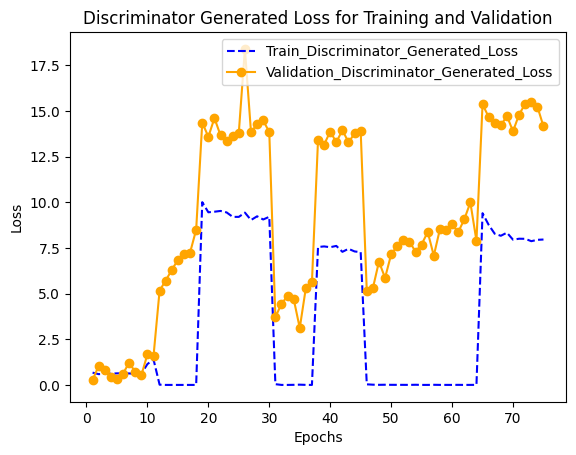

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses,'-or', color='orange', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [63]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [64]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [65]:
os.mkdir('/kaggle/working/modelsFeb7')

In [66]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [67]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [68]:
import subprocess
from IPython.display import FileLink, display

In [69]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip